## **UTS Machine Learning**
* Nama : Hero Kartiko
* NIM : 1103210205

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import confusion_matrix
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

%matplotlib inline

Library yang digunakan pada klasifikasi dataset ini.

In [2]:
df = pd.read_excel('Dry_Bean_Dataset.xlsx')

In [3]:
df.head(20)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
7,30519,629.727,212.996755,182.737204,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER
8,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER
9,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061,SEKER


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [5]:
df['Class'].value_counts()

Class
DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64

In [6]:
# Display basic information about the dataset
data_info = {
    "Shape": df.shape,
    "Features": df.columns.tolist(),
    "Classes": df['Class'].unique(),
    "Class Distribution": df['Class'].value_counts().to_dict()
}

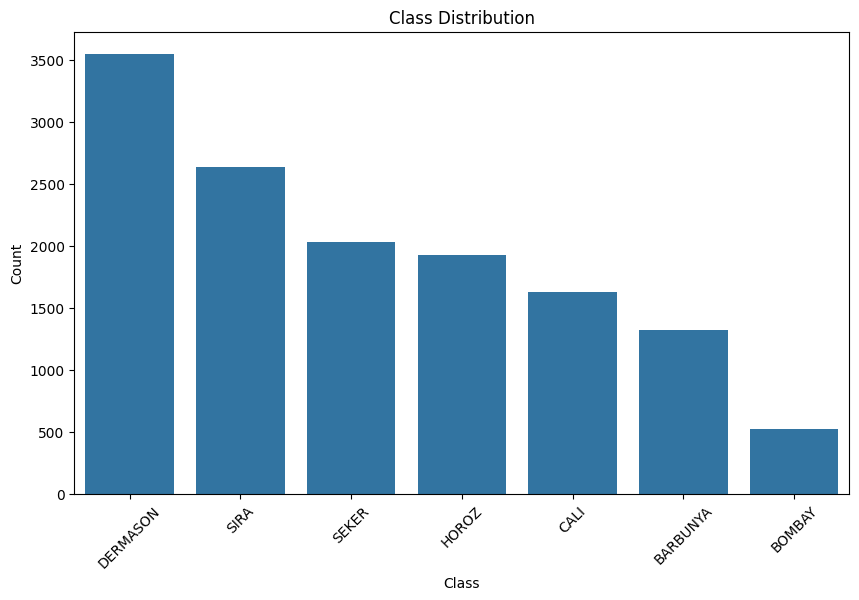

In [7]:
# Visualization 1: Class distribution bar plot
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Class', order=df['Class'].value_counts().index)
plt.title('Class Distribution')
plt.ylabel('Count')
plt.xlabel('Class')
plt.xticks(rotation=45)
plt.show()

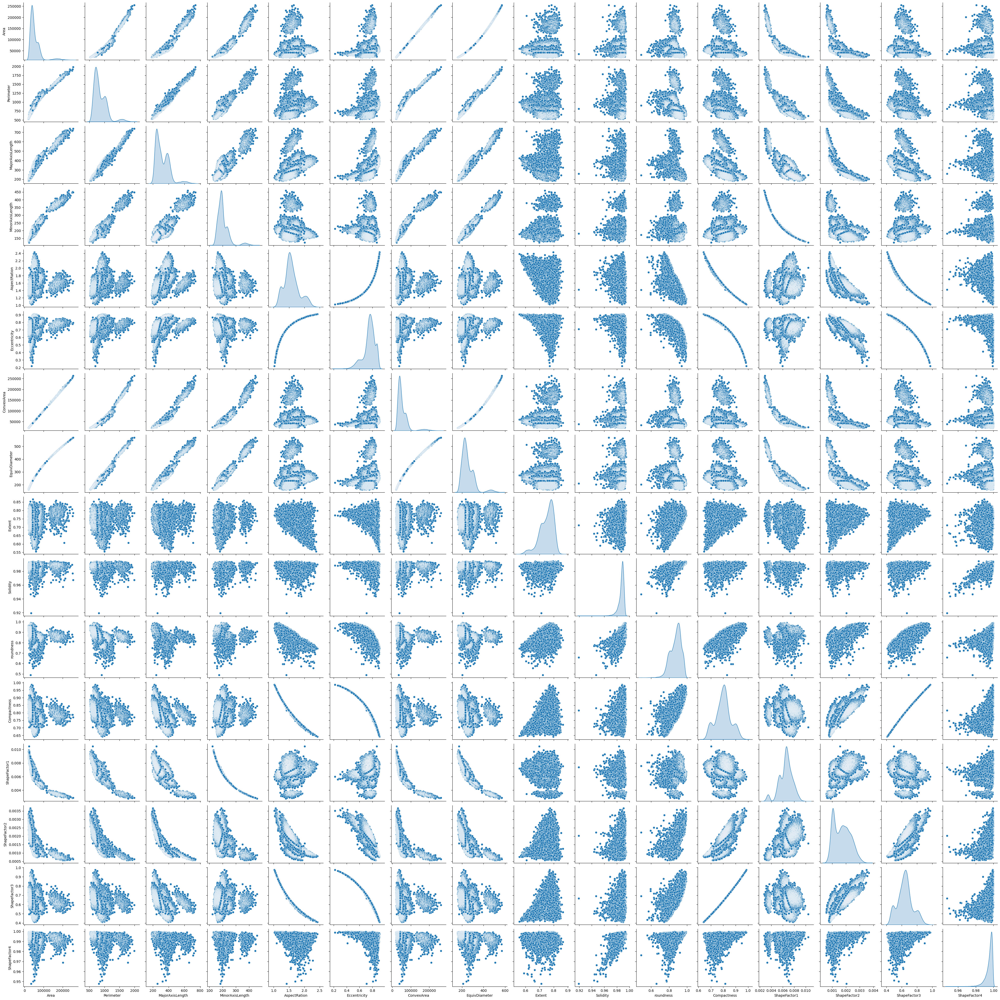

In [8]:
# Exclude non-numeric columns for pairplot
numeric_data_clean = df.select_dtypes(include=['float64', 'int64'])

# Check the cleaned dataset
numeric_data_clean.head()

# Retry pairplot with cleaned numeric data
sns.pairplot(numeric_data_clean, diag_kind='kde', height=2.5)
plt.show()

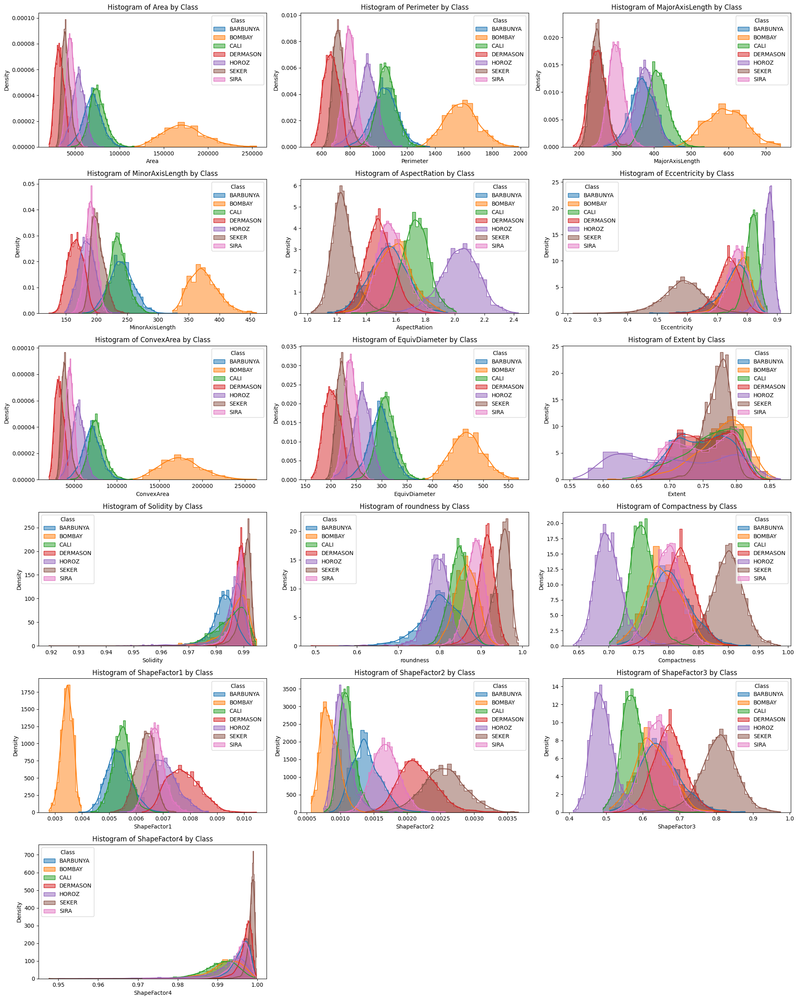

In [9]:
# Prompt : make histogram feature all class

# Create histograms for each numeric feature, grouped by 'Class'
numeric_features = numeric_data_clean.columns

# Set up the plotting grid
plt.figure(figsize=(20, 25))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(len(numeric_features) // 3 + 1, 3, i)
    for class_name, group in df.groupby('Class'):
        sns.histplot(group[feature], label=class_name, kde=True, element='step', stat='density')
    plt.title(f'Histogram of {feature} by Class')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend(title='Class')

plt.tight_layout()
plt.show()

In [10]:
#Prompt : Make mean for all class feature and print like table

# Create a pivot table to calculate the mean of each feature for each class
df.pivot_table(columns='Class', values=df.columns[:-1], aggfunc='mean')


Class,BARBUNYA,BOMBAY,CALI,DERMASON,HOROZ,SEKER,SIRA
Area,69804.133132,173485.059387,75538.211043,32118.710942,53648.508817,39881.299951,44729.128604
AspectRation,1.544395,1.585550,1.733663,1.490471,2.026119,1.245182,1.570083
Compactness,0.805001,0.792622,0.756703,0.819110,0.700880,0.896841,0.797345
ConvexArea,71025.729198,175813.116858,76688.503067,32498.435138,54440.091805,40269.567341,45273.099772
Eccentricity,0.754665,0.770518,0.814804,0.736632,0.867443,0.584781,0.767277
EquivDiameter,297.311018,468.941426,309.535280,201.683813,260.730715,224.948441,238.335316
Extent,0.749273,0.776559,0.758953,0.752953,0.706393,0.771674,0.749445
MajorAxisLength,370.044279,593.152075,409.499538,246.557279,372.570290,251.291957,299.380258
MinorAxisLength,240.309352,374.352547,236.370616,165.657143,184.170663,201.909653,190.800250
Perimeter,1046.105764,1585.619079,1057.634282,665.209536,919.859676,727.672440,796.418737


In [11]:
class_parameter = {"DERMASON" : 0, "SIRA" : 1, "SEKER" : 2, "HOROZ" : 3, "CALI" : 4, "BARBUNYA" : 5, "BOMBAY" : 6}
df["Class"] = df["Class"].map(class_parameter)
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,2
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,2
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,2
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,2
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,2


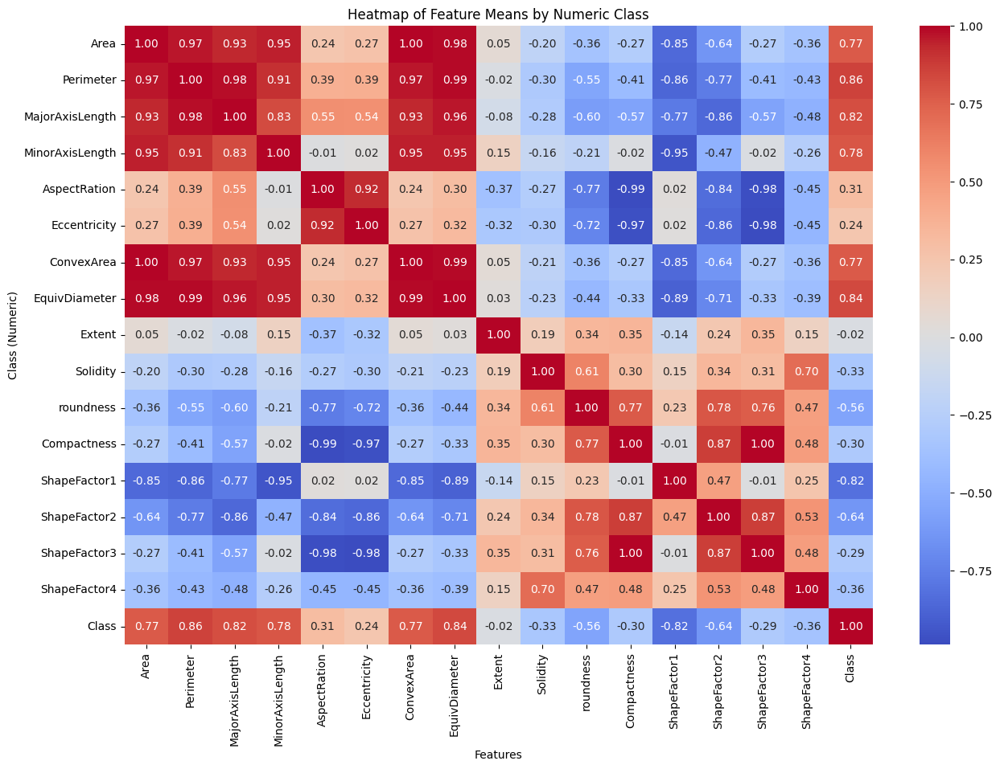

In [12]:
df_corr = df.corr()
# Plot the heatmap with numeric labels for class
plt.figure(figsize=(15, 10))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', fmt=".2f", cbar=True)
plt.title('Heatmap of Feature Means by Numeric Class')
plt.xlabel('Features')
plt.ylabel('Class (Numeric)')
plt.show()

## Classification

Prompt : make a classification model from dataset dry_bean_dataset.xsls

In [13]:
# Encode the target labels and save class names
label_encoder = LabelEncoder()
df['Class'] = label_encoder.fit_transform(df['Class'])
class_names = label_encoder.classes_  # Save original class names

In [14]:
# Separate features and target
X = df.drop(columns='Class')  # Features
y = df['Class']  # Encoded target

In [15]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Prompt : buatlah classification model pada dataset dry_bean_dataset.xslx dengan model basis function, decision tree, knn, xgboost

In [16]:
# Models
models = {
    "Logistic Regression": LogisticRegression(max_iter=100, random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
}

# Train and evaluate each model
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=["DERMASON", "SIRA", "SEKER", "HOROZ", "CALI", "BARBUNYA", "BOMBAY" ])
    
    # Display the results
    print(f"\nModel: {model_name}")
    print("Accuracy:", accuracy)
    print("\nClassification Report:\n", report)

c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Model: Logistic Regression
Accuracy: 0.6845391112743298

Classification Report:
               precision    recall  f1-score   support

    DERMASON       0.79      0.84      0.81       671
        SIRA       0.60      0.62      0.61       536
       SEKER       0.67      0.58      0.63       413
       HOROZ       0.61      0.64      0.63       408
        CALI       0.72      0.68      0.70       317
    BARBUNYA       0.53      0.50      0.52       261
      BOMBAY       0.99      1.00      1.00       117

    accuracy                           0.68      2723
   macro avg       0.70      0.70      0.70      2723
weighted avg       0.68      0.68      0.68      2723


Model: Decision Tree
Accuracy: 0.8927653323540213

Classification Report:
               precision    recall  f1-score   support

    DERMASON       0.88      0.88      0.88       671
        SIRA       0.83      0.83      0.83       536
       SEKER       0.93      0.91      0.92       413
       HOROZ       0.95     

c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:00:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Model: XGBoost
Accuracy: 0.9239809034153507

Classification Report:
               precision    recall  f1-score   support

    DERMASON       0.90      0.91      0.90       671
        SIRA       0.85      0.88      0.86       536
       SEKER       0.97      0.94      0.95       413
       HOROZ       0.98      0.96      0.97       408
        CALI       0.94      0.96      0.95       317
    BARBUNYA       0.93      0.91      0.92       261
      BOMBAY       1.00      1.00      1.00       117

    accuracy                           0.92      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.92      0.92      0.92      2723



In [17]:
# Train, evaluate, and display feature importances for each model
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=["DERMASON", "SIRA", "SEKER", "HOROZ", "CALI", "BARBUNYA", "BOMBAY" ])
    
    # Display the results
    # print(f"\nModel: {model_name}")
    # print("Accuracy:", accuracy)
    # print("\nClassification Report:\n", report)
    
    # Display feature importances if available
    if model_name in ["Decision Tree", "XGBoost"]:
        feature_importances = model.feature_importances_
        feature_importances_df = pd.DataFrame({
            "Feature": X.columns,
            "Importance": feature_importances
        }).sort_values(by="Importance", ascending=False)
        
        print("\nFeature Importances:")
        print(feature_importances_df)

c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Feature Importances:
            Feature  Importance
14     ShapeFactor3    0.211709
2   MajorAxisLength    0.183093
12     ShapeFactor1    0.178061
1         Perimeter    0.160845
3   MinorAxisLength    0.076660
10        roundness    0.066292
15     ShapeFactor4    0.033305
9          Solidity    0.018628
11      Compactness    0.017694
8            Extent    0.014541
0              Area    0.012870
6        ConvexArea    0.008355
13     ShapeFactor2    0.006567
4      AspectRation    0.004152
7     EquivDiameter    0.004143
5      Eccentricity    0.003085


c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:00:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Feature Importances:
            Feature  Importance
11      Compactness    0.292413
6        ConvexArea    0.255913
0              Area    0.098956
12     ShapeFactor1    0.096260
2   MajorAxisLength    0.081467
1         Perimeter    0.050300
3   MinorAxisLength    0.032406
10        roundness    0.029675
13     ShapeFactor2    0.023001
4      AspectRation    0.014413
15     ShapeFactor4    0.012010
9          Solidity    0.007764
8            Extent    0.005422
5      Eccentricity    0.000000
7     EquivDiameter    0.000000
14     ShapeFactor3    0.000000


c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


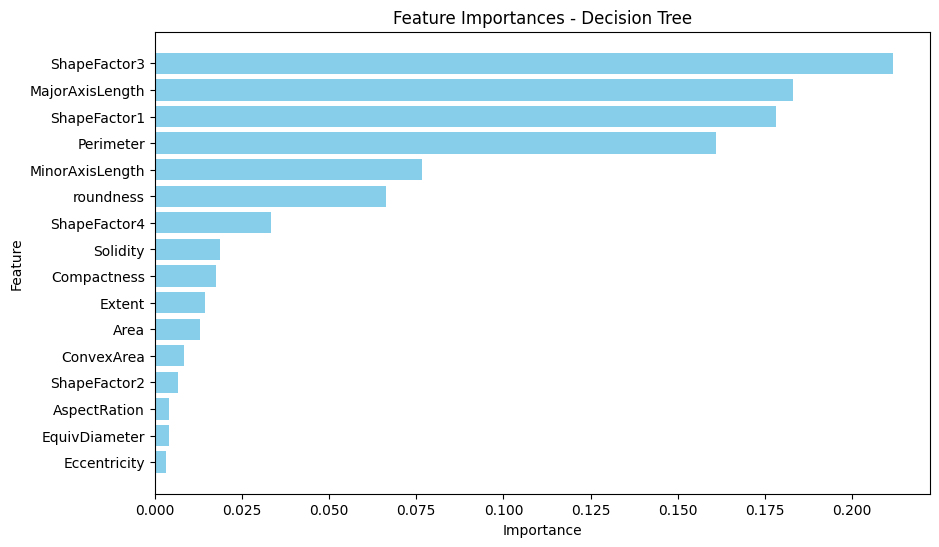

c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:00:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


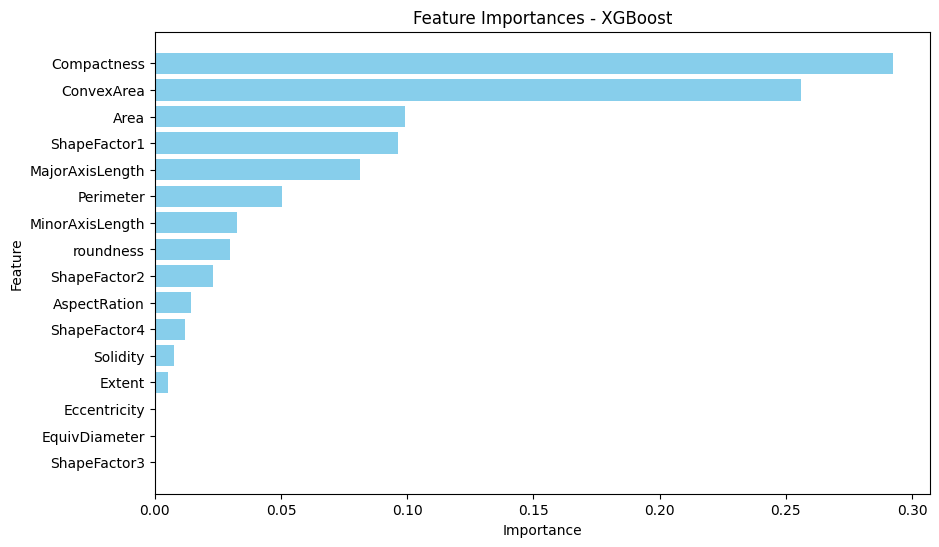

In [18]:
# Train, evaluate, and display feature importances with plots for each model
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=["DERMASON", "SIRA", "SEKER", "HOROZ", "CALI", "BARBUNYA", "BOMBAY" ])
    
    # Display the results
    # print(f"\nModel: {model_name}")
    # print("Accuracy:", accuracy)
    # print("\nClassification Report:\n", report)
    
    # Display and plot feature importances if available
    if model_name in ["Decision Tree", "XGBoost"]:
        feature_importances = model.feature_importances_
        feature_importances_df = pd.DataFrame({
            "Feature": X.columns,
            "Importance": feature_importances
        }).sort_values(by="Importance", ascending=False)
        
        # Plot feature importances
        plt.figure(figsize=(10, 6))
        plt.barh(feature_importances_df["Feature"], feature_importances_df["Importance"], color='skyblue')
        plt.xlabel("Importance")
        plt.ylabel("Feature")
        plt.title(f"Feature Importances - {model_name}")
        plt.gca().invert_yaxis()  # To have the most important feature at the top
        plt.show()

c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


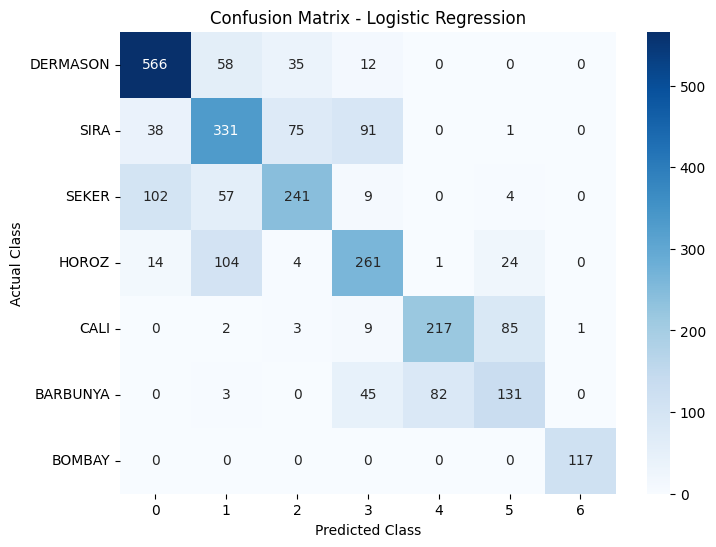

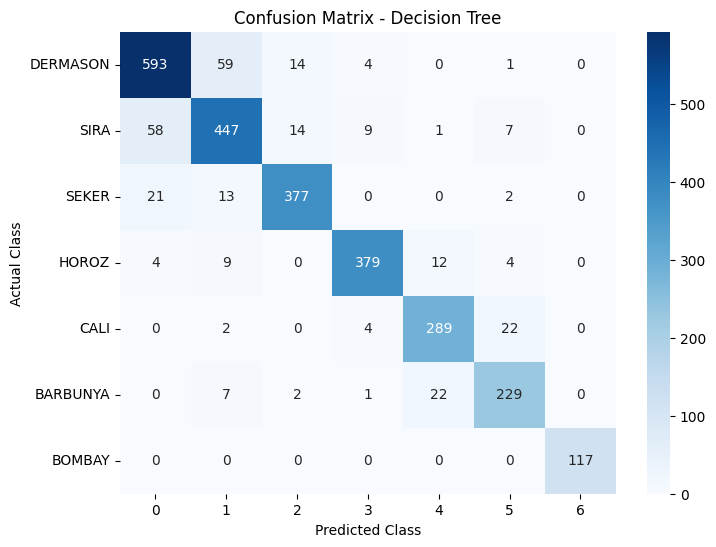

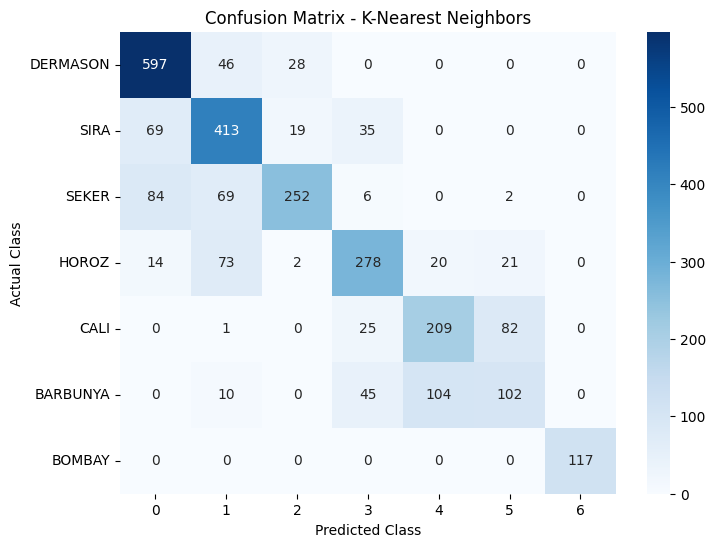

c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:00:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


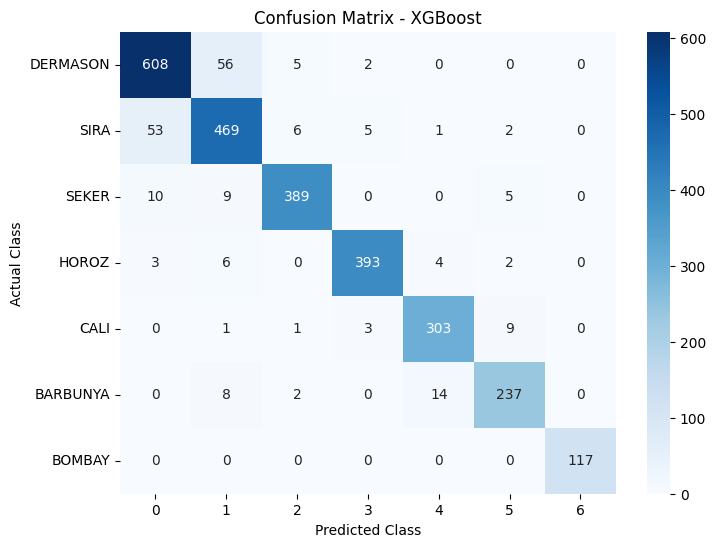

In [19]:
# Train, evaluate, and display confusion matrix for each model
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=["DERMASON", "SIRA", "SEKER", "HOROZ", "CALI", "BARBUNYA", "BOMBAY" ])
    
    # Display the results
    # print(f"\nModel: {model_name}")
    # print("Accuracy:", accuracy)
    # print("\nClassification Report:\n", report)
    
    # Plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=["DERMASON", "SIRA", "SEKER", "HOROZ", "CALI", "BARBUNYA", "BOMBAY" ])
    plt.xlabel("Predicted Class")
    plt.ylabel("Actual Class")
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()


## **Hypertuning**

Prompt : buatkan hypertuning untuk model klasifikasi pada dataset Dry_Bean_Dataset.csv

In [32]:
from sklearn.model_selection import GridSearchCV

# Hyperparameter grids
param_grids = {
    "Logistic Regression": {
        'C': [0.01, 0.1, 1, 10],
        'penalty': ['l2'],
        'solver': ['lbfgs']
    },
    "Decision Tree": {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    "K-Nearest Neighbors": {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    },
    "XGBoost": {
        'n_estimators': [50, 100, 200],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.2],
        'subsample': [0.8, 1.0]
    }
}

# Define models
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

# Perform GridSearchCV for each model
best_models = {}
best_scores = {}
for model_name, model in models.items():
    print(f"Tuning {model_name}...")
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grids[model_name],
        scoring='accuracy',
        cv=3,
        verbose=1,
        n_jobs=-1
    )
    grid_search.fit(X_train, y_train)
    best_models[model_name] = grid_search.best_estimator_
    best_scores[model_name] = grid_search.best_score_
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")
    print(f"Best accuracy for {model_name}: {grid_search.best_score_:.4f}")

# Evaluate the best models on the test set
for model_name, best_model in best_models.items():
    y_pred = best_model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"\nModel: {model_name}")
    print(f"Test Accuracy: {accuracy:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred, target_names=["DERMASON", "SIRA", "SEKER", "HOROZ", "CALI", "BARBUNYA", "BOMBAY" ]))


Tuning Logistic Regression...
Fitting 3 folds for each of 4 candidates, totalling 12 fits


c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Best parameters for Logistic Regression: {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}
Best accuracy for Logistic Regression: 0.7044
Tuning Decision Tree...
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best parameters for Decision Tree: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}
Best accuracy for Decision Tree: 0.9066
Tuning K-Nearest Neighbors...
Fitting 3 folds for each of 16 candidates, totalling 48 fits
Best parameters for K-Nearest Neighbors: {'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'distance'}
Best accuracy for K-Nearest Neighbors: 0.7862
Tuning XGBoost...
Fitting 3 folds for each of 54 candidates, totalling 162 fits


c:\Users\NITRO 5\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:12:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}
Best accuracy for XGBoost: 0.9291

Model: Logistic Regression
Test Accuracy: 0.6996
Classification Report:
               precision    recall  f1-score   support

    DERMASON       0.78      0.86      0.82       671
        SIRA       0.60      0.65      0.62       536
       SEKER       0.69      0.56      0.62       413
       HOROZ       0.65      0.62      0.64       408
        CALI       0.73      0.71      0.72       317
    BARBUNYA       0.62      0.58      0.60       261
      BOMBAY       1.00      1.00      1.00       117

    accuracy                           0.70      2723
   macro avg       0.72      0.71      0.72      2723
weighted avg       0.70      0.70      0.70      2723


Model: Decision Tree
Test Accuracy: 0.9078
Classification Report:
               precision    recall  f1-score   support

    DERMASON       0.88      0.92      0.90       671
        SIR

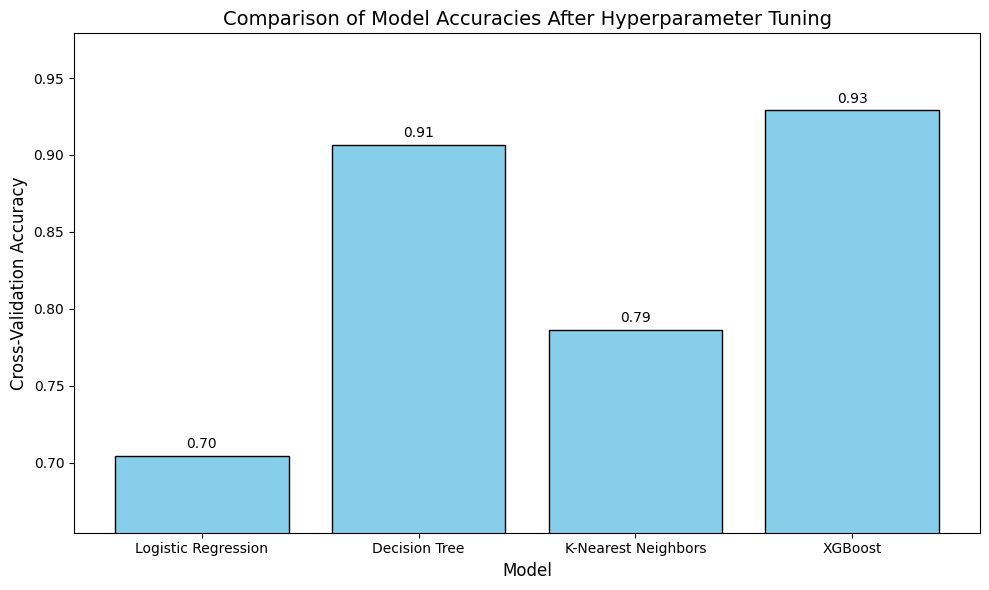

In [36]:
import matplotlib.pyplot as plt

# Visualize the results from best_scores
model_names = list(best_scores.keys())
scores = list(best_scores.values())

# Plotting the accuracies of different models
plt.figure(figsize=(10, 6))
plt.bar(model_names, scores, color='skyblue', edgecolor='black')
plt.title("Comparison of Model Accuracies After Hyperparameter Tuning", fontsize=14)
plt.xlabel("Model", fontsize=12)
plt.ylabel("Cross-Validation Accuracy", fontsize=12)
plt.ylim(min(scores) - 0.05, max(scores) + 0.05)  # Dynamically adjust y-axis
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
for i, score in enumerate(scores):
    plt.text(i, score + 0.005, f"{score:.2f}", ha='center', fontsize=10, color='black')

plt.tight_layout()
plt.show()


In [37]:
# Identify the overall best model
best_model_name = max(best_scores, key=best_scores.get)
best_model_params = best_models[best_model_name]
best_model_score = best_scores[best_model_name]

# Display the best model overall
print(f"\nThe Best Model Overall is {best_model_name} with parameters {best_model_params} and a Cross-Validation Score of {best_model_score:.4f}")


The Best Model Overall is XGBoost with parameters XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=7,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...) and a Cross-Validation Score of 0.9291


Kesimpulan : dapat disimpulkan bahwa model XGBoost adalah model terbaik yang dapat digunakan pada dataset dengan parameter max_depth = 5, n_estimator = 200m dan learning rate = 0.01. Dengan nilai Cross Validation 0.9289 model ini menunjukkan performa yang sangat baik dalam memprediksi kelas pada parameter setelah dilakukan optimasi.